# Capstone Project: The Battle of the Neighborhoods (Week 2)

### Applied Data Science Capstone by IBM/Coursera

## Introduction: Business Problem

Of all the fast food restaurants, my friends and family frequent Chick-fil-A the most by far.  Every time we go, there are always several customers there and we joke that Chick-fil-A is a gold mine.  Recently, I got to meet someone going through the training program to become a restaurant operator and I'd like to apply what I've learned to potentially help them find the best locations to open a new restaurant, specifically in Austin, TX.  This means that I will be ignoring the surrounding cities.

## Data

Factors that will influence the decision are:

- distance from the nearest Chick-Fil-A restaurant
- number of restaurants in the area

The following data sources will be needed:
- Venue locations in Austin, TX will be obtained from the cities inspections data
- GPS coordinates based on given addresses will be obtained using geopy. 

### Foursquare data

First, let's examine the foursquare data.  My search query will be 'food' to make it as broad as possible.  I don't want to limit my search to only fast food restaurants.  Most restaurants now offer take out if needing something quick and often when trying to decide where to eat, a limitation to fast food virtually never implemented.  I want to make sure to get everything in the austin area, so I will set the radius to 30,000 meters. 

In [1]:
import requests # library to handle requests
CLIENT_ID = 'JCCZGLKLXDAWPI4Q1NNYL2Z0TMXAZEFC0AWZCLZTMRWMKPPN' # my Foursquare ID
CLIENT_SECRET = 'GGARHQCFNODYE23EWXFM05FIIT1YE0KRG5WRATCX5WVY11MD' # your Foursquare Secret
VERSION = '20180604'

#Here is the latitude and longitude for the center of Austin.  This was found with a simple google search.
austin_lat = 30.2672
austin_lon = -97.7431

search_query = 'food'
radius = 30000
LIMIT = 5000

url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, austin_lat, austin_lon, VERSION, search_query, radius, LIMIT)
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5edadfd029ce6a001b40526b'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'},
    {'name': '$-$$$$', 'key': 'price'}]},
  'headerLocation': 'Austin',
  'headerFullLocation': 'Austin',
  'headerLocationGranularity': 'city',
  'query': 'food',
  'totalResults': 232,
  'suggestedBounds': {'ne': {'lat': 30.53720027000027,
    'lng': -97.43106912381872},
   'sw': {'lat': 29.99719972999973, 'lng': -98.05513087618128}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4aa06c38f964a520923f20e3',
       'name': "Perry's Steakhouse",
       'location': {'address': '114 W 7th St',
        'crossStreet': 'at Colorado St',
        'lat': 30.269373758193904,
        'lng': -97.7436759

The foursquare query only returns 232 results.  I know this far too small.  A more thorough resource is available from the city of Austin.

### City of Austin Inspection Data

After playing around with the query, it became clear that it will not suffice and I would need another source of data.  I was able to acquire a full list of inspection data from the city of Austin.  Data can be found here:
https://data.austintexas.gov/Health-and-Community-Services/Food-Establishment-Inspection-Scores/ecmv-9xxi

Every food establishment need to pass an inspection to operate, thus it has a complete list of venues operating within the city.  The dataset was last updated on May 31, 2020 and dates back to December 13, 2011. 

Let's take  look at the data.

In [3]:
import pandas as pd
# Loading data from csv on github.  
raw_inspection_data_csv_url = "https://raw.githubusercontent.com/bgarrido46/Coursera_Capstone/master/Restaurant_Inspection_Scores_Raw.csv"
raw_inspection_df = pd.read_csv(raw_inspection_data_csv_url)
print(raw_inspection_df.head(10))

                            Restaurant Name  Zip Code Inspection Date  Score  \
0                BC - Cinemark Hill Country   78738.0       6/29/2017     99   
1                             Smoothie King   78746.0       11/6/2018     98   
2                       MN - Shipley Donuts   78653.0      12/19/2018    100   
3                             Biryani & Co.   78759.0      11/22/2019     78   
4                              Schlotzsky's   78757.0        3/5/2020     96   
5                        Wieland Elementary   78660.0       8/27/2019     97   
6                          Circle # 2741552   78724.0       6/27/2017     87   
7                           Doss Elementary   78757.0       9/16/2019     90   
8  Austin Presbyterian Theological Seminary   78705.0      11/13/2017     94   
9                          Respite Recovery   78701.0       6/26/2017     96   

                                             Address  Facility ID  \
0  12812 HILL COUNTRY BLVD\nBEE CAVE, TX 78738\n(.

There are several fields that aren't necessary for this project (Score, Inspection Date, etc...).  There are also multiple inspections for many restaurants.  Using excel, I deleted any duplicates based on "Restaurant Name", "Adress", and "Zip Code".

The address field contains the latitude and longitude for most locations.  I use the following excel formulas to extract that information:

latitude: "=MID(E2,FIND("(",E2,1)+1, (LEN(E2)-FIND(", -",E2,1))-3)"

longitude: "=MID(E2,FIND(", -",E2,1)+3, (LEN(E2)-FIND(", -",E2,1))-3)"

#### Restaurants Without A Latitude or Longitude

Just under 10% of the venues do not have a latitude or logitude in the address field.  I'll use geopy to find these latitudes and longitudes.

In [4]:
import urllib.request
# Loading data from csv on github.  
restaurants_with_no_lat_lon_csv_url = "https://raw.githubusercontent.com/bgarrido46/Coursera_Capstone/master/Restaurant_Inspection_Scores_Empty_Lat_Lon.csv"
no_lat_lon_df = pd.read_csv(restaurants_with_no_lat_lon_csv_url, index_col=0)

In [5]:
#Replace /n character with a space
no_lat_lon_df = no_lat_lon_df.replace({r'\s+$': '', r'^\s+': ''}, regex=True).replace(r'\n',  ' ', regex=True)

In [6]:
from geopy.geocoders import Nominatim
venue_latitude = []
venue_longitude = []
geolocator = Nominatim(user_agent="austin_explorer")
for i in range(len(no_lat_lon_df)):
    location = geolocator.geocode(no_lat_lon_df.iloc[i][3])
    if location:
        venue_latitude.append(location.latitude)
        venue_longitude.append(location.longitude)
    else:
        venue_latitude.append(0)
        venue_longitude.append(0)

In [7]:
no_lat_lon_df = no_lat_lon_df.assign(Latitude=venue_latitude)

In [8]:
no_lat_lon_df = no_lat_lon_df.assign(Longitude=venue_longitude)

In [9]:
no_lat_lon_df.head(10)

,Zip Code,Inspection Date,Score,Address,Facility ID,Process Description,Latitude,Longitude
Restaurant Name,,,,,,,,
183 Grill Austin Gyros,78729,1/28/2016,95,"13729 N US 183 HWY NB Unit 890 AUSTIN, TX 78729",11368998,Routine Inspection,0.000000,0.000000
6M Grocery,78652,4/27/2015,93,"805 W FM 1626 RD AUSTIN, TX 78652",2803436,Routine Inspection,0.000000,0.000000
7 Eleven # 32248,78717,2/8/2016,80,"14016 N FM 620 RD SB AUSTIN, TX 78717",10886896,Routine Inspection,0.000000,0.000000
7 Eleven #36575,78660,1/23/2017,96,"15829 N IH 35 SVRD NB AUSTIN, TX 78660",10874330,Routine Inspection,0.000000,0.000000
7-Eleven #36562H,78744,1/29/2015,78,"6422 S US 183 HWY SB AUSTIN, TX 78744",10874472,Routine Inspection,0.000000,0.000000
7-Eleven 36559H,78734,1/28/2015,89,"3636 N FM 620 RD AUSTIN, TX 78734",10874261,Routine Inspection,30.432362,-97.841458
7-Eleven Convenience Store # 36564A,78732,2/2/2015,100,"7002 N FM 620 RD AUSTIN, TX 78732",11066939,Routine Inspection,30.432362,-97.841458
7-Eleven Convenience Store #36597A,78749,3/29/2016,99,"5445 W US 290 HWY EB AUSTIN, TX 78749",11087909,Routine Inspection,0.000000,0.000000
7-Eleven Convenience Store #36599A,78750,12/6/2016,95,"11613 N FM 620 RD AUSTIN, TX 78750",11522598,Routine Inspection,30.432362,-97.841458


In [10]:
no_lat_lon_df.shape

(449, 8)

Looks like geopy was unable to find the latitude and longitude of each restaurant.  By examining the data set of restaurants without GPS coordinates, none of them are a Chick-Fil-A restaurant.  Given this fact and that it was already less than 10% of the data set, this shouldn't have much affect on the final decision

#### Cleaned Restaurant Data

Now that we found some of the missing GPS data, we need to load the venues that did have GPS coordinates and append the dataframe above to get a complete data set.

In [11]:
cleaned_inspection_data_url = "https://raw.githubusercontent.com/bgarrido46/Coursera_Capstone/master/Restaurant_Inspection_Scores_Cleaned.csv"
cleaned_inspection_data_df = pd.read_csv(cleaned_inspection_data_url)
cleaned_inspection_data_df.shape

(4657, 9)

In [12]:
complete_cleaned_inspection_data_df = cleaned_inspection_data_df.append(no_lat_lon_df, ignore_index =True)

In [13]:
complete_cleaned_inspection_data_df.shape

(5106, 9)

Now I'll remove the unnecesary columns.

In [14]:
complete_cleaned_inspection_data_df = complete_cleaned_inspection_data_df.drop(columns = ['Zip Code','Inspection Date', 'Score','Facility ID', 'Process Description'])

In [15]:
complete_cleaned_inspection_data_df.shape

(5106, 4)

In [17]:
import folium
# create map of Austin using latitude and longitude values from above.  
complete_restaurant_map_austin = folium.Map(location=[austin_lat, austin_lon], zoom_start=10)

# add markers to map
for lat, lng, adr in zip(complete_cleaned_inspection_data_df['Latitude'], complete_cleaned_inspection_data_df['Longitude'],
                        complete_cleaned_inspection_data_df['Address']):
    label = str(adr)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(complete_restaurant_map_austin)  
    
complete_restaurant_map_austin

Ok, now to refine the search a little bit.  I want to split this into two different data frames.  
    
    1) Chick-Fil-A restaurants 
    2) All other venues
    

In [18]:
Chick_Fil_A_Austin_df = complete_cleaned_inspection_data_df.loc[complete_cleaned_inspection_data_df['Restaurant Name'] == 'Chick-Fil-A']
Chick_Fil_A_Austin_df

,Restaurant Name,Address,Latitude,Longitude
782,Chick-Fil-A,"12501 N MOPAC EXPY NB\nAUSTIN, TX 78758\n(30.4...",30.419232,-97.703865
783,Chick-Fil-A,"500 E BEN WHITE BLVD WB Bldg B\nAUSTIN, TX 787...",30.220068,-97.757510
784,Chick-Fil-A,"161 W SLAUGHTER LN Bldg B\nAUSTIN, TX 78748\n(...",30.167179,-97.791596
785,Chick-Fil-A,"10901 RESEARCH BLVD NB\nAUSTIN, TX 78759\n(30....",30.401079,-97.745373
786,Chick-Fil-A,"12901 N IH 35 SVRD NB\nAUSTIN, TX 78753\n(30.4...",30.412880,-97.673060
787,Chick-Fil-A,"503 W MARTIN LUTHER KING JR BLVD\nAUSTIN, TX 7...",30.282040,-97.743064
788,Chick-Fil-A,"503 W MARTIN LUTHER KING JR BLVD\nAUSTIN, TX 7...",30.282040,-97.743064
789,Chick-Fil-A,"2901 S CAPITAL OF TEXAS HWY NB\nAUSTIN, TX 787...",30.254658,-97.809462
790,Chick-Fil-A,"11200 LAKELINE MALL DR Unit VC02\nAUSTIN, TX 7...",30.471810,-97.803451
791,Chick-Fil-A,"5033 W US 290 HWY SVRD EB Bldg D\nAUSTIN, TX 7...",30.233500,-97.824390


In [19]:
All_Other_Venues_df = complete_cleaned_inspection_data_df.loc[~complete_cleaned_inspection_data_df['Restaurant Name'].str.contains('Chick-Fil-A', na=False)]

I'm going to add a column 'Distance' to the 'All_Other_Venues_df' with a value of 0.  Then I'm going to calculate the distance ot the nearest Chick-Fil-A restaurant in Austin using the 'Chick_Fil_A_Austin_df'.

In [22]:
Chick_Fil_A_Austin_df['Distance'] = 0

from math import sin, cos, sqrt, atan2, radians

# approximate radius of earth in miles
R = 3958.8
distances = []

for i in range(len(All_Other_Venues_df)):
    lat1 = radians(All_Other_Venues_df.iloc[i][2])
    lon1 = radians(All_Other_Venues_df.iloc[i][3])
    min_distance = 100
    for j in range(len(Chick_Fil_A_Austin_df)):
        lat2 = radians(Chick_Fil_A_Austin_df.iloc[j][2])
        lon2 = radians(Chick_Fil_A_Austin_df.iloc[j][3])
        dlon = lon2 - lon1
        dlat = lat2 - lat1

        a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
        c = 2 * atan2(sqrt(a), sqrt(1 - a))

        distance = R * c

        if distance < min_distance:
            min_distance = distance
    distances.append(min_distance)
    
    
All_Other_Venues_df = All_Other_Venues_df.assign(Distance=distances)
All_Other_Venues_df.head(10)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Restaurant Name,Address,Latitude,Longitude,Distance
0,"""CB's"" at Stubb's Bar-B-Q","809 RED RIVER ST\nAUSTIN, TX 78701\n(30.269075...",30.269075,-97.736231,0.984230
1,15th Street Cafe,"303 W 15TH ST\nAUSTIN, TX 78701\n(30.277693, -...",30.277693,-97.742469,0.302443
2,1st Food Mart,"1410 S 1ST ST\nAUSTIN, TX 78704\n(30.250229, -...",30.250229,-97.754856,2.089961
3,1-Stop Food Store,"5101 AIRPORT BLVD\nAUSTIN, TX 78751\n(30.31236...",30.312363,-97.715363,2.668442
4,2 Dine 4 Fine Catering,"3008 GONZALES ST\nAUSTIN, TX 78702\n(30.259363...",30.259363,-97.707080,2.658166
5,2 n 1 Salad Bar and Grill,"901 W BRAKER LN\nAUSTIN, TX 78758\n(30.382937,...",30.382937,-97.688914,2.274421
6,21st St. College House,"707 W 21ST ST\nAUSTIN, TX 78705\n(30.28409, -9...",30.284090,-97.745913,0.221266
7,2222 Market,"1112 W KOENIG LN\nAUSTIN, TX 78757\n(30.329699...",30.329699,-97.729142,3.396063
8,24 Diner,"600 N LAMAR BLVD\nAUSTIN, TX 78703\n(30.271744...",30.271744,-97.753872,0.960202
9,290 West Bar & Grill,"12013 W US 290 HWY\nAUSTIN, TX 78737\n(30.2114...",30.211473,-97.968303,8.725738


Ok, now we know how far away a Chick-Fil-A is from each restaurant in the city.  Now I want to see what the map looks like if I remove all restaurants that are within 3 miles of a Chick-Fil-A and remove any outliers. That is, locations that are on the outskirts of the city.  

In [23]:
Venues_With_No_CFA_Nearby = All_Other_Venues_df.loc[(All_Other_Venues_df['Distance'] > 3) & (All_Other_Venues_df['Distance'] < 10) ]
Venues_With_No_CFA_Nearby.head(10)

,Restaurant Name,Address,Latitude,Longitude,Distance
7,2222 Market,"1112 W KOENIG LN\nAUSTIN, TX 78757\n(30.329699...",30.329699,-97.729142,3.396063
9,290 West Bar & Grill,"12013 W US 290 HWY\nAUSTIN, TX 78737\n(30.2114...",30.211473,-97.968303,8.725738
16,"360 Pizza, LLC",6203 N CAPITAL OF TEXAS HWY NB Unit A100\nAUST...,30.360309,-97.790126,3.879587
17,360 Uno,3801 N CAPITAL OF TEXAS HWY NB Bunit 100\nAUST...,30.336788,-97.805109,5.292116
18,3M Austin Center,"6801 RIVER PLACE BLVD\nAUSTIN, TX 78726\n(30.3...",30.396018,-97.844774,5.786552
24,512 Market Kitchen,"4506 WELETKA DR\nAUSTIN, TX 78734\n(30.40607, ...",30.406070,-97.926061,8.601168
42,7-Eleven #24397,"5901 BURNET RD\nAUSTIN, TX 78757\n(30.334993, ...",30.334993,-97.739801,3.663913
47,7-Eleven Convenience Store # 36274A,"3324 NORTHLAND DR\nAUSTIN, TX 78731\n(30.33720...",30.337206,-97.756615,3.896409
51,7-Eleven Convenience Store # 36604A,"6518 ED BLUESTEIN BLVD SB\nAUSTIN, TX 78723\n(...",30.303264,-97.661019,5.109755
52,7-Eleven Convenience Store # 36612A,"6707 CAMERON RD\nAUSTIN, TX 78752\n(30.322591,...",30.322591,-97.694362,4.036199


In [24]:
# create map of Austin using latitude and longitude values
Venues_With_No_CFA_Nearby_map = folium.Map(location=[austin_lat, austin_lon], zoom_start=10)

# add markers to map
for lat, lng in zip(Venues_With_No_CFA_Nearby['Latitude'], Venues_With_No_CFA_Nearby['Longitude']):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(Venues_With_No_CFA_Nearby_map)  
    
Venues_With_No_CFA_Nearby_map

Clearing up the map shows there is a clear lack of Chick-Fil-A restaurants in North Austin and North-West Austin.  This will be my area of focus.  Before doing the cluster analysis, I'm going to filter out restaurants that aren't in the targeted area.

First lets find the center point for this region and then determine the distance of each restaurant from this point.

In [27]:
#Center point of the north, northwest Austin area
center_lat = radians(30.347102)
center_lon = radians(-97.711887)

distances_from_center = []


for i in range(len(Venues_With_No_CFA_Nearby)):
    lat = radians(Venues_With_No_CFA_Nearby.iloc[i][2])
    lon = radians(Venues_With_No_CFA_Nearby.iloc[i][3])
    dlon = center_lon - lon
    dlat = center_lat - lat

    a = sin(dlat / 2)**2 + cos(lat) * cos(center_lat) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c

    distances_from_center.append(distance)
    
    
Venues_With_No_CFA_Nearby = Venues_With_No_CFA_Nearby.assign(Distance_From_Center=distances_from_center)

# create map of Austin using latitude and longitude values
Distance_From_Center_map = folium.Map(location=[30.347102,-97.711887], zoom_start=10)

# add markers to map
for lat, lng, dc in zip(Venues_With_No_CFA_Nearby['Latitude'], Venues_With_No_CFA_Nearby['Longitude'], Venues_With_No_CFA_Nearby['Distance_From_Center'] ):
    label = str(dc)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(Distance_From_Center_map)  
    
Distance_From_Center_map

Once the 'Distance_From_Center' reaches 4 miles, then it's outside the region I've determined to focus on.  Now I'll filter the dataframe to only include venues within 4 miles.

In [28]:
Focus_df = Venues_With_No_CFA_Nearby.loc[(Venues_With_No_CFA_Nearby['Distance_From_Center'] < 4) ]
Focus_df = Focus_df.reset_index(drop=True)

# create map of Austin using latitude and longitude values
focus_map = folium.Map(location=[30.347102,-97.711887], zoom_start=10)

# add markers to map
for lat, lng, dc in zip(Focus_df['Latitude'], Focus_df['Longitude'], Focus_df['Distance_From_Center'] ):
    label = str(dc)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(focus_map)  
    
focus_map

In [29]:
Focus_df

,Restaurant Name,Address,Latitude,Longitude,Distance,Distance_From_Center
0,2222 Market,"1112 W KOENIG LN\nAUSTIN, TX 78757\n(30.329699...",30.329699,-97.729142,3.396063,1.582598
1,7-Eleven #24397,"5901 BURNET RD\nAUSTIN, TX 78757\n(30.334993, ...",30.334993,-97.739801,3.663913,1.862968
2,7-Eleven Convenience Store # 36274A,"3324 NORTHLAND DR\nAUSTIN, TX 78731\n(30.33720...",30.337206,-97.756615,3.896409,2.753375
3,7-Eleven Convenience Store # 36612A,"6707 CAMERON RD\nAUSTIN, TX 78752\n(30.322591,...",30.322591,-97.694362,4.036199,1.990070
4,7-Eleven Convenience Store #25445,"8900 N LAMAR BLVD\nAUSTIN, TX 78758\n(30.35798...",30.357983,-97.699906,4.026353,1.037072
...,...,...,...,...,...,...
617,"Your Dream Wedding & Events, Inc.","8309 RESEARCH BLVD NB\nAUSTIN, TX 78758\n(30.3...",30.356189,-97.715224,3.584653,0.658630
618,Yumilicious,"2700 W ANDERSON LN Unit 227\nAUSTIN, TX 78757\...",30.358106,-97.735077,3.031943,1.577925
619,Zoe's Safe Place,"8007 BURNET RD\nAUSTIN, TX 78757\n(30.358776, ...",30.358776,-97.730147,3.060549,1.354963
620,Zorba Creek Diner,"5501 BALCONES DR Bldg B\nAUSTIN, TX 78731\n(30...",30.336462,-97.757774,3.861258,2.833285


Looking much better.  Before beginning the cluster analysis, lets determine what the optimal k is.

In [30]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
clustering_Opt_Test = Focus_df.drop(columns = ['Restaurant Name', 'Address','Distance_From_Center'])

mms = MinMaxScaler()
mms.fit(clustering_Opt_Test)
data_transformed = mms.transform(clustering_Opt_Test)

In [31]:
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_transformed)
    Sum_of_squared_distances.append(km.inertia_)

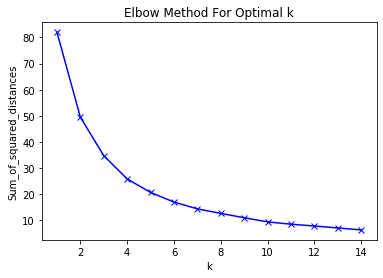

In [32]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

Using the elbow method, it appears using a k=4 is the best.  Now let's perform the cluster analysis.

In [42]:
kclusters = 4
clustering = Focus_df.drop(columns=['Restaurant Name', 'Address', 'Distance_From_Center'])
# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 1, 1, 2, 3, 3, 2, 1, 0, 3])

In [46]:
Focus_df.insert(0, 'Cluster', kmeans.labels_)
Focus_df

,Cluster,Restaurant Name,Address,Latitude,Longitude,Distance,Distance_From_Center
0,1,2222 Market,"1112 W KOENIG LN\nAUSTIN, TX 78757\n(30.329699...",30.329699,-97.729142,3.396063,1.582598
1,2,7-Eleven #24397,"5901 BURNET RD\nAUSTIN, TX 78757\n(30.334993, ...",30.334993,-97.739801,3.663913,1.862968
2,2,7-Eleven Convenience Store # 36274A,"3324 NORTHLAND DR\nAUSTIN, TX 78731\n(30.33720...",30.337206,-97.756615,3.896409,2.753375
3,3,7-Eleven Convenience Store # 36612A,"6707 CAMERON RD\nAUSTIN, TX 78752\n(30.322591,...",30.322591,-97.694362,4.036199,1.990070
4,0,7-Eleven Convenience Store #25445,"8900 N LAMAR BLVD\nAUSTIN, TX 78758\n(30.35798...",30.357983,-97.699906,4.026353,1.037072
...,...,...,...,...,...,...,...
617,0,"Your Dream Wedding & Events, Inc.","8309 RESEARCH BLVD NB\nAUSTIN, TX 78758\n(30.3...",30.356189,-97.715224,3.584653,0.658630
618,2,Yumilicious,"2700 W ANDERSON LN Unit 227\nAUSTIN, TX 78757\...",30.358106,-97.735077,3.031943,1.577925
619,2,Zoe's Safe Place,"8007 BURNET RD\nAUSTIN, TX 78757\n(30.358776, ...",30.358776,-97.730147,3.060549,1.354963
620,2,Zorba Creek Diner,"5501 BALCONES DR Bldg B\nAUSTIN, TX 78731\n(30...",30.336462,-97.757774,3.861258,2.833285


In [44]:
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as colors
# create map
map_clusters = folium.Map(location=[30.347102,-97.711887], zoom_start=10)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, cluster in zip(Focus_df['Latitude'], Focus_df['Longitude'],  Focus_df['Cluster']):
    label = folium.Popup(' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [38]:
cluster0_df = Focus_df.loc[(Focus_df['Cluster'] == 0) ]
cluster1_df = Focus_df.loc[(Focus_df['Cluster'] == 1) ]
cluster2_df = Focus_df.loc[(Focus_df['Cluster'] == 2) ]
cluster3_df = Focus_df.loc[(Focus_df['Cluster'] == 3) ]

In [45]:
stats = {'Color': ['Red', 'Purple', 'Teal', 'Olive Green'],
                               'Avg Distance From Chick-Fil-A': [cluster0_df['Distance'].mean(),cluster1_df['Distance'].mean(),
                                                cluster2_df['Distance'].mean(),cluster3_df['Distance'].mean()],
                               'Restaurant Density': [len(cluster0_df), len(cluster1_df), len(cluster2_df),len(cluster3_df)]}
analysis_matrix = pd.DataFrame(stats)
analysis_matrix

,Color,Avg Distance From Chick-Fil-A,Restaurant Density
0,Red,3.707279,163
1,Purple,3.799143,151
2,Teal,3.482685,186
3,Olive Green,4.380479,122


## Results and Discussion

From the analysis, we can see that Austin is known for its food for a reason.  With over 5000 venues within just the Austin city limits, competition is steep.  We noticed that there is a big pocket in the North-Northwest area of Austin that doesn't have a Chick-Fil-A within 3 miles of any restaurant in the area.  This gives us a prime area to pay attention to and look for opportunities.

After focusing in on smaller area of the city, we created four cluster zones that are dense with business activity.  

The result of this does not imply that these are the most optimal locations in the entire city of Austin.  The purpose was only to find locations that are far enough away from a current operating Chick-Fil-A, that denizens may find it to far to travel, especially in Austin traffic.  

## Conclusion

Purpose of this project was to identify areas in Austin that do not have a nearby Chick-Fil-A in order to aid my acquaintance in finding a location to open a new restaurant.  By calculating restaurant density and distance to the nearest Chick-Fil-A, we have identified an opportunistic area in North-Northwest Austin.  Focusing on that area, clusters can be generated to further refine the search.

The final decision on the optimal location is to be made by my acquaintance.  Additional factors, such as population density, major roads, major offices or campuses, real estate availability and economic factors (both social and real estate) within each cluster should be considered.  